In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('crime.csv')

In [3]:
data.columns

Index(['INCIDENT_ID', 'OFFENSE_ID', 'OFFENSE_CODE', 'OFFENSE_CODE_EXTENSION',
       'OFFENSE_TYPE_ID', 'OFFENSE_CATEGORY_ID', 'FIRST_OCCURRENCE_DATE',
       'LAST_OCCURRENCE_DATE', 'REPORTED_DATE', 'INCIDENT_ADDRESS', 'GEO_X',
       'GEO_Y', 'GEO_LON', 'GEO_LAT', 'DISTRICT_ID', 'PRECINCT_ID',
       'NEIGHBORHOOD_ID', 'IS_CRIME', 'IS_TRAFFIC'],
      dtype='object')

In [4]:
data.head()

,INCIDENT_ID,OFFENSE_ID,OFFENSE_CODE,OFFENSE_CODE_EXTENSION,OFFENSE_TYPE_ID,OFFENSE_CATEGORY_ID,FIRST_OCCURRENCE_DATE,LAST_OCCURRENCE_DATE,REPORTED_DATE,INCIDENT_ADDRESS,GEO_X,GEO_Y,GEO_LON,GEO_LAT,DISTRICT_ID,PRECINCT_ID,NEIGHBORHOOD_ID,IS_CRIME,IS_TRAFFIC
0,2016376978,2016376978521300,5213,0,weapon-unlawful-discharge-of,all-other-crimes,6/15/2016 11:31:00 PM,NaN,6/15/2016 11:31:00 PM,NaN,3193983.0,1707251.0,-104.809881,39.773188,5,521,montbello,1,0
1,20186000994,20186000994239900,2399,0,theft-other,larceny,10/11/2017 12:30:00 PM,10/11/2017 4:55:00 PM,1/29/2018 5:53:00 PM,NaN,3201943.0,1711852.0,-104.781434,39.785649,5,522,gateway-green-valley-ranch,1,0
2,20166003953,20166003953230500,2305,0,theft-items-from-vehicle,theft-from-motor-vehicle,3/4/2016 8:00:00 PM,4/25/2016 8:00:00 AM,4/26/2016 9:02:00 PM,2932 S JOSEPHINE ST,3152762.0,1667011.0,-104.957381,39.663490,3,314,wellshire,1,0
3,201872333,201872333239900,2399,0,theft-other,larceny,1/30/2018 7:20:00 PM,NaN,1/30/2018 10:29:00 PM,705 S COLORADO BLVD,3157162.0,1681320.0,-104.941440,39.702698,3,312,belcaro,1,0
4,2017411405,2017411405230300,2303,0,theft-shoplift,larceny,6/22/2017 8:53:00 PM,NaN,6/23/2017 4:09:00 PM,2810 E 1ST AVE,3153211.0,1686545.0,-104.955370,39.717107,3,311,cherry-creek,1,0


In [5]:
parsed_data = data.drop(['INCIDENT_ID', 'OFFENSE_ID', 'OFFENSE_CODE', 'OFFENSE_CODE_EXTENSION','OFFENSE_TYPE_ID', 'LAST_OCCURRENCE_DATE', 'REPORTED_DATE', 'INCIDENT_ADDRESS', 'GEO_X', 'GEO_Y', 'GEO_LON', 'GEO_LAT','NEIGHBORHOOD_ID'], axis=1)

In [6]:
parsed_data.columns

Index(['OFFENSE_CATEGORY_ID', 'FIRST_OCCURRENCE_DATE', 'DISTRICT_ID',
       'PRECINCT_ID', 'IS_CRIME', 'IS_TRAFFIC'],
      dtype='object')

In [7]:
parsed_data.head()

,OFFENSE_CATEGORY_ID,FIRST_OCCURRENCE_DATE,DISTRICT_ID,PRECINCT_ID,IS_CRIME,IS_TRAFFIC
0,all-other-crimes,6/15/2016 11:31:00 PM,5,521,1,0
1,larceny,10/11/2017 12:30:00 PM,5,522,1,0
2,theft-from-motor-vehicle,3/4/2016 8:00:00 PM,3,314,1,0
3,larceny,1/30/2018 7:20:00 PM,3,312,1,0
4,larceny,6/22/2017 8:53:00 PM,3,311,1,0


In [8]:
 parsed_data['OFFENSE_CATEGORY_ID'].value_counts()

traffic-accident                119902
all-other-crimes                 84398
public-disorder                  48387
larceny                          46282
theft-from-motor-vehicle         34099
drug-alcohol                     30751
auto-theft                       24208
burglary                         22938
other-crimes-against-persons     22398
aggravated-assault               10755
white-collar-crime                6178
robbery                           5974
sexual-assault                    3749
arson                              577
murder                             261
Name: OFFENSE_CATEGORY_ID, dtype: int64

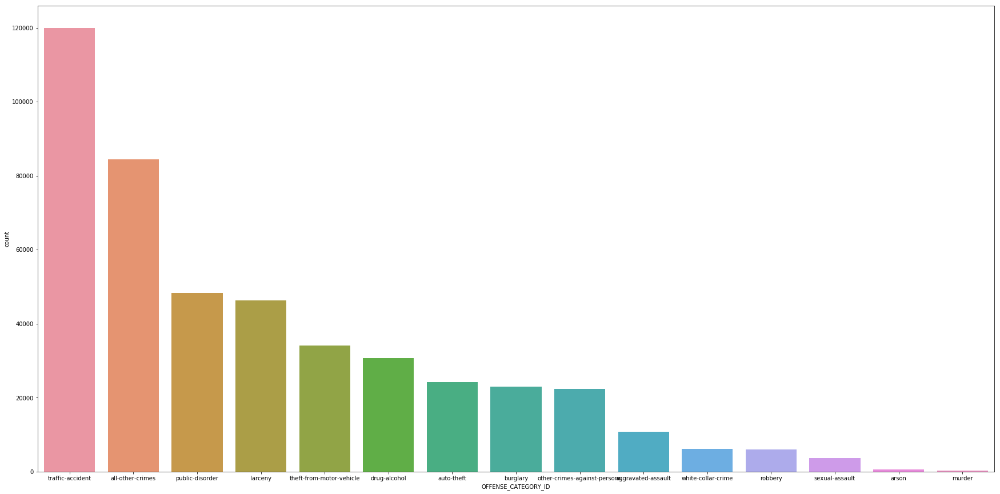

In [9]:
plt.figure(figsize=(30,15))
sns.countplot(x='OFFENSE_CATEGORY_ID', data=parsed_data, order = parsed_data['OFFENSE_CATEGORY_ID'].value_counts().index)

In [10]:
import datetime
from dateutil import parser

In [11]:
parsed_data['Date'] = parsed_data['FIRST_OCCURRENCE_DATE'].apply(lambda x: parser.parse(x))

In [12]:
parsed_data.drop('FIRST_OCCURRENCE_DATE', axis=1,inplace=True)

In [13]:
parsed_data['Date'][0].weekday()

2

In [14]:
parsed_data['DOW']= parsed_data['Date'].apply(lambda x: x.weekday())

In [15]:
parsed_data.head()

,OFFENSE_CATEGORY_ID,DISTRICT_ID,PRECINCT_ID,IS_CRIME,IS_TRAFFIC,Date,DOW
0,all-other-crimes,5,521,1,0,2016-06-15 23:31:00,2
1,larceny,5,522,1,0,2017-10-11 12:30:00,2
2,theft-from-motor-vehicle,3,314,1,0,2016-03-04 20:00:00,4
3,larceny,3,312,1,0,2018-01-30 19:20:00,1
4,larceny,3,311,1,0,2017-06-22 20:53:00,3


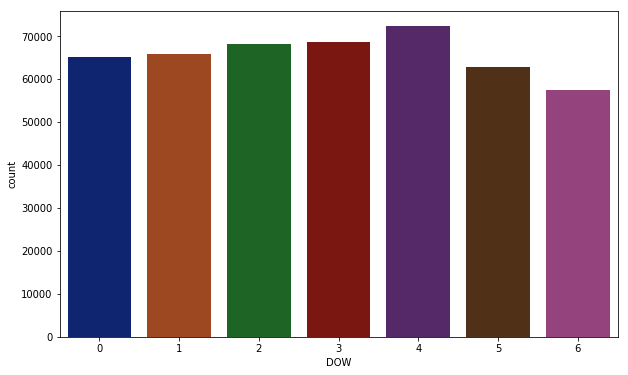

In [16]:
plt.figure(figsize=(10,6))
sns.countplot(x='DOW',data=parsed_data, palette='dark')


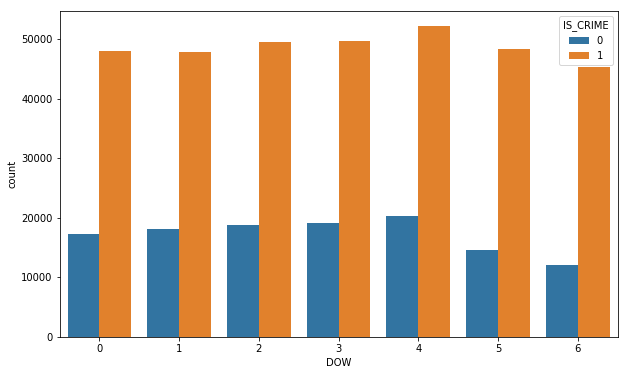

In [17]:
plt.figure(figsize=(10,6))
sns.countplot(x='DOW',data=parsed_data, hue='IS_CRIME')

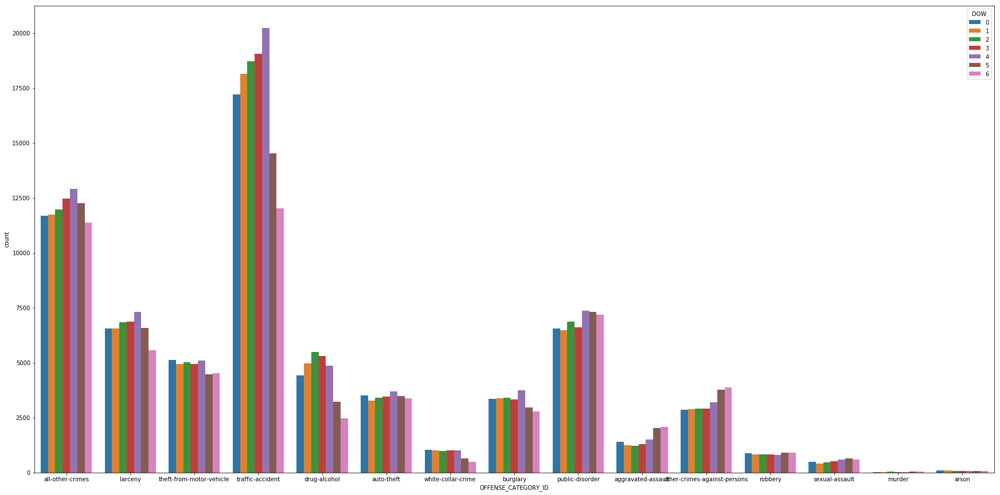

In [18]:
plt.figure(figsize=(30,15))
sns.countplot(x='OFFENSE_CATEGORY_ID', data=parsed_data, hue='DOW')

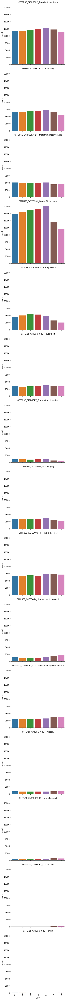

In [19]:
sns.catplot(x='DOW', row='OFFENSE_CATEGORY_ID',data=parsed_data, kind="count")

In [20]:
plot_arson = parsed_data[parsed_data['OFFENSE_CATEGORY_ID'] == 'arson']

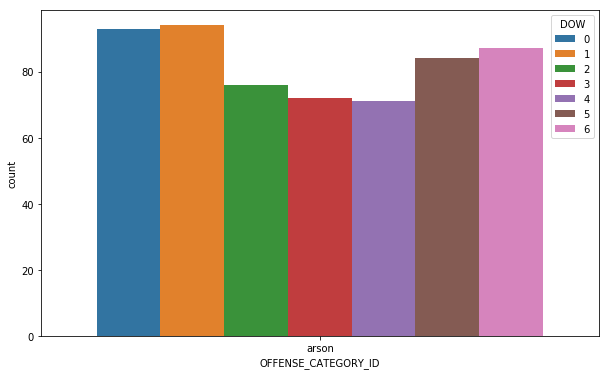

In [21]:
plt.figure(figsize=(10,6))
sns.countplot(x='OFFENSE_CATEGORY_ID', hue='DOW', data=plot_arson )

In [22]:
plot_murder = parsed_data[parsed_data['OFFENSE_CATEGORY_ID'] == 'murder']

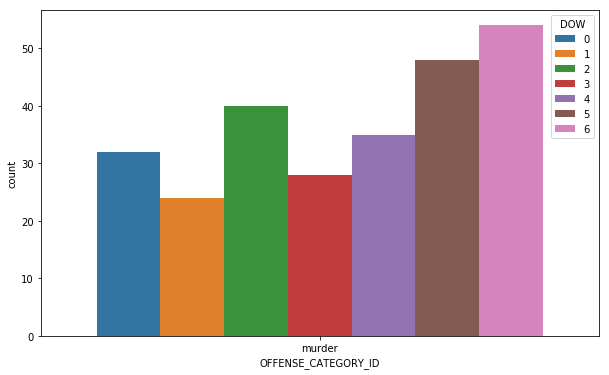

In [23]:
plt.figure(figsize=(10,6))
sns.countplot(x='OFFENSE_CATEGORY_ID', hue='DOW', data=plot_murder )

In [24]:
parsed_data['Month'] = parsed_data['Date'].apply(lambda x: x.month)

In [25]:
parsed_data.head()

,OFFENSE_CATEGORY_ID,DISTRICT_ID,PRECINCT_ID,IS_CRIME,IS_TRAFFIC,Date,DOW,Month
0,all-other-crimes,5,521,1,0,2016-06-15 23:31:00,2,6
1,larceny,5,522,1,0,2017-10-11 12:30:00,2,10
2,theft-from-motor-vehicle,3,314,1,0,2016-03-04 20:00:00,4,3
3,larceny,3,312,1,0,2018-01-30 19:20:00,1,1
4,larceny,3,311,1,0,2017-06-22 20:53:00,3,6


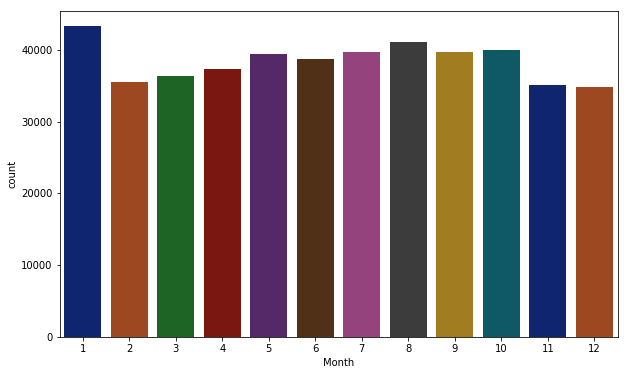

In [26]:
plt.figure(figsize=(10,6))
sns.countplot(x='Month',data=parsed_data, palette='dark')

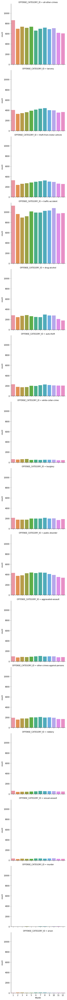

In [29]:
sns.catplot(x='Month', row='OFFENSE_CATEGORY_ID',data=parsed_data, kind="count")

In [32]:
parsed_data.columns

Index(['OFFENSE_CATEGORY_ID', 'DISTRICT_ID', 'PRECINCT_ID', 'IS_CRIME',
       'IS_TRAFFIC', 'Date', 'DOW', 'Month'],
      dtype='object')

In [33]:
plt.figure(figsize=(10,6))
sns.countplot(x='OFFENSE_CATEGORY_ID', hue='Month', data=plot_murder)

ValueError: Could not interpret input 'Month'

<Figure size 720x432 with 0 Axes>

In [39]:
parsed_data['Year'] = parsed_data['Date'].apply(lambda x: x.year)

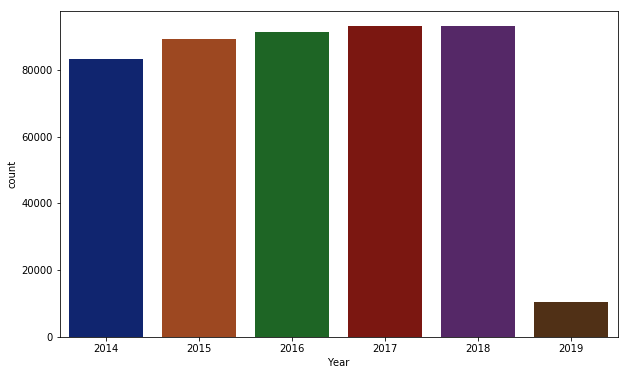

In [40]:
plt.figure(figsize=(10,6))
sns.countplot(x='Year',data=parsed_data, palette='dark')

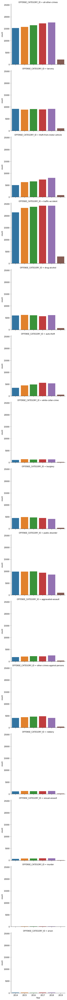

In [42]:
sns.catplot(x='Year', row='OFFENSE_CATEGORY_ID',data=parsed_data, kind="count")

In [50]:
parsed_data['Hour'] = parsed_data['Date'].apply(lambda x: x.hour)

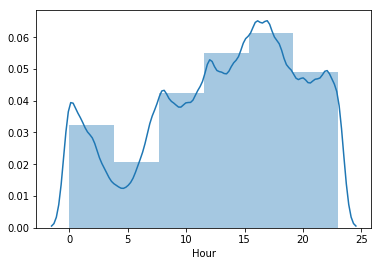

In [54]:
sns.distplot(parsed_data['Hour'], bins = 6)

In [55]:
from plotly import __version__
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [58]:
parsed_data['Hour'].iplot(kind='hist', bins=6)